In [56]:
import os
import torch
import random
from pathlib import Path
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from torch import nn
from torchvision.transforms import ToTensor
import numpy as np
from PIL import Image
from tqdm import tqdm
from matplotlib import pyplot as plt
from IPython.display import clear_output


In [57]:
seed = 42
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
BCELoss = torch.nn.BCEWithLogitsLoss()

In [3]:
class FacadesDataset(Dataset):
    def __init__(self, files):
        self.files = files
        
    def __len__(self):
        return len(self.files)
    
    def __getitem__(self, idx):
        data = np.array(Image.open(self.files[idx]))
        label = ToTensor()(data[:, :256, :])
        image = ToTensor()(data[:, 256:, :])
        return image, label

In [4]:
def PlotPrediction(model, image, label, epoch=0, epochs=0, g_loss=0, d_loss=0, size=(15, 5), mode='train'):
    titles = ['Input Image', 'Ground Truth', 'Predicted Image']
    model.eval()
    pred = model(image)
    images = [image, label, pred]
    plt.figure(figsize=size)
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(titles[i])
        plt.imshow(images[i][0].cpu().detach().permute(1, 2, 0).clamp(0, 1))
        plt.axis('off')
    if mode=='train':
        plt.suptitle('Epoch {}/{} --- GenLoss: {:.4f} --- DiscLoss: {:.4f}'.format(epoch, epochs,
                                                                              g_loss, d_loss))
    plt.show()

In [5]:
def TrainPix2Pix(G, D, G_optimizer, D_optimizer, train_gen, epochs=100):
    Gen_losses=[]
    Disc_losses=[]
    for epoch in range(1, epochs+1):
        D_losses = []
        G_losses = []

        for inputs, target in tqdm(train_gen):

            # Input & Target image data
            x = inputs.to(device)
            y = target.to(device)

            # Train Discriminator with real data
            D_real_decision = D(torch.cat([x, y], 1))
            real_ = torch.ones(D_real_decision.size()).to(device)

            # Train Discriminator with fake data
            gen_image = G(x)
            D_fake_decision = D(torch.cat([x, gen_image], 1))
            fake_ = torch.zeros(D_fake_decision.size()).to(device)
            
            # D_real_loss
            D_real_loss = BCELoss(D_real_decision, real_)
            
            # D_fake_loss
            D_fake_loss = BCELoss(D_fake_decision, fake_)
            
            # D_loss
            D_loss = (D_real_loss + D_fake_loss) * 0.5

            # Discriminator Back propagation
            D.zero_grad()
            D_loss.backward()
            D_optimizer.step()

            # Train Generator with generated image
            gen_image = G(x)
            D_fake_decision = D(torch.cat([x, gen_image], 1))
            
            # G_fake_loss
            G_fake_loss = BCELoss(D_fake_decision, real_)

            # L1_loss
            l1_loss = 100 * torch.mean(torch.abs(gen_image - y))
            
            # G_loss
            G_loss = G_fake_loss + l1_loss

            # Generator Back propagation
            G.zero_grad()
            G_loss.backward()
            G_optimizer.step()

            # Loss values
            D_losses.append(D_loss.item())
            G_losses.append(G_loss.item())
        Gen_losses.append(np.mean(G_losses))
        Disc_losses.append(np.mean(D_losses))
        clear_output(wait=True)
        PlotPrediction(G, x, y, epoch, epochs, Gen_losses[-1], Disc_losses[-1])
    return {'GenLoss': Gen_losses, 'DiscLoss': Disc_losses}

In [6]:

def DownConv2d(input_size, output_size, kernel_size, batchnorm=True):
    layers = [nn.Conv2d(input_size, output_size, kernel_size, stride=2, padding=1, bias=False)]
    if batchnorm:
        layers.append(nn.BatchNorm2d(output_size))
    layers.append(nn.LeakyReLU())
    torch.manual_seed(seed)
    return nn.Sequential(*layers)

def UpConv2d(input_size, output_size, kernel_size, dropout=False):
    layers = [nn.ConvTranspose2d(input_size, output_size, kernel_size, stride=2, padding=1, bias=False)]
    layers.append(nn.BatchNorm2d(output_size))
    if dropout:
        layers.append(nn.Dropout(p=0.5))
    layers.append(nn.ReLU())
    torch.manual_seed(seed)
    return nn.Sequential(*layers)
    
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.block1 = DownConv2d(input_size=6, output_size=32,kernel_size=4, batchnorm=False)
        self.block2 = DownConv2d(input_size=32,output_size=64,kernel_size=4)
        self.block3 = DownConv2d(input_size=64,output_size=128,kernel_size=4)
        self.output = nn.Sequential(
                            nn.ZeroPad2d(1),
                            nn.Conv2d(128, 256, kernel_size=4, stride=1, bias=False),
                            nn.BatchNorm2d(256),
                            nn.LeakyReLU(),
                            nn.ZeroPad2d(1),
                            nn.Conv2d(256, 1, kernel_size=4, stride=1, bias=False))
    def forward(self, x):
        d1 = self.block1(x)
        d2 = self.block2(d1)
        d3 = self.block3(d2)
        out = self.output(d3)
        return out
    
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.block1 = DownConv2d(input_size=3, output_size=32, kernel_size=4, batchnorm=False)
        self.block2 = DownConv2d(input_size=32, output_size=64, kernel_size=4)
        self.block3 = DownConv2d(input_size=64, output_size=128, kernel_size=4)
        self.block4 = DownConv2d(input_size=128, output_size=256, kernel_size=4)
        self.block5 = DownConv2d(input_size=256, output_size=256, kernel_size=4)
        
        self.unblock5 = UpConv2d(input_size=256, output_size=256, kernel_size=4, dropout=True)
        self.unblock4 = UpConv2d(input_size=512, output_size=128, kernel_size=4, dropout=True)
        self.unblock3 = UpConv2d(input_size=256, output_size=64, kernel_size=4)
        self.unblock2 = UpConv2d(input_size=128, output_size=32, kernel_size=4)
        self.unblock1 = UpConv2d(input_size=64, output_size=3, kernel_size=4)
        
        self.output = nn.Sequential(nn.Conv2d(in_channels=6, out_channels=3, kernel_size=1, stride=1, bias=False),
                                 nn.Tanh())
        
    def forward(self, x):
        d1 = self.block1(x)
        d2 = self.block2(d1)
        d3 = self.block3(d2)
        d4 = self.block4(d3)
        d5 = self.block5(d4)
        
        up5 = self.unblock5(d5)
        up4 = self.unblock4(torch.cat([up5, d4], 1))
        up3 = self.unblock3(torch.cat([up4, d3], 1))
        up2 = self.unblock2(torch.cat([up3, d2], 1))
        up1 = self.unblock1(torch.cat([up2, d1], 1))
        
        out = self.output(torch.cat([up1, x], 1))
        return out


In [11]:
G = Generator().to(device)
D = Discriminator().to(device)

In [12]:
data_dir = 'dataset/facades/'

random.seed(seed)
train_files = sorted(Path(os.path.join(data_dir, 'train')).rglob('*.jpg'))
random.shuffle(train_files)
val_files = sorted(Path(os.path.join(data_dir, 'val')).rglob('*.jpg'))
random.shuffle(val_files)

In [13]:
train_set = FacadesDataset(train_files)
val_set = FacadesDataset(val_files)
print('Num samples in:\nTrain: {}\nTest: {}'.format(len(train_set), len(val_set)))

Num samples in:
Train: 400
Test: 100


In [14]:
train_gen = DataLoader(train_set, batch_size=1, shuffle=False)
val_gen = DataLoader(val_set, batch_size=1, shuffle=False)
print('Num batches in:\nTrain: {}\nTest: {}'.format(len(train_gen), len(val_gen)))

Num batches in:
Train: 400
Test: 100


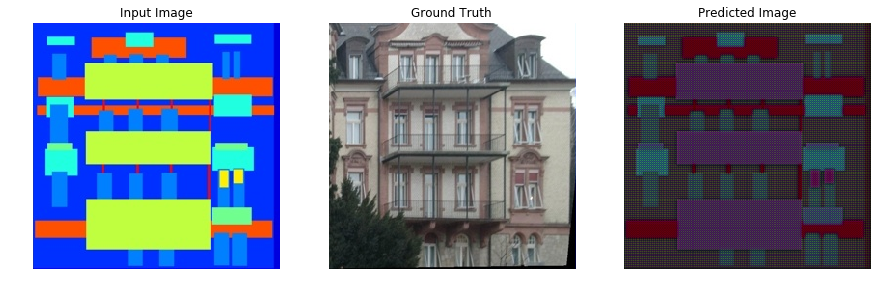

In [15]:
x, y = next(iter(train_gen))
PlotPrediction(G, x.to(device), y.to(device), mode='test')

In [16]:
G_optimizer = torch.optim.Adam(G.parameters(), lr=1e-3, betas=(0.5, 0.999))
D_optimizer = torch.optim.Adam(D.parameters(), lr=1e-3, betas=(0.5, 0.999))

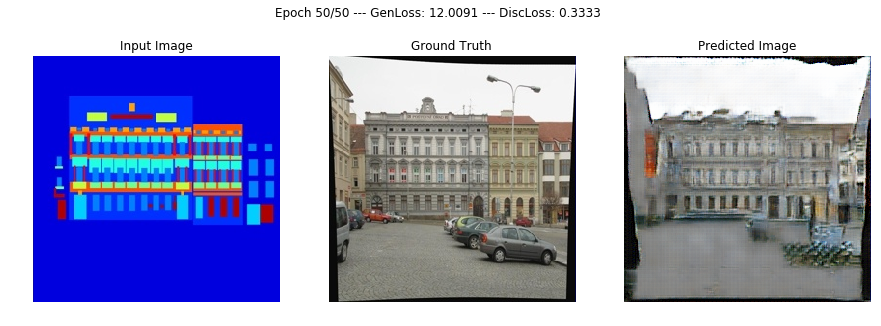

Wall time: 41min 42s


In [17]:
%%time
losses = TrainPix2Pix(G, D, G_optimizer, D_optimizer, train_gen, epochs=50)

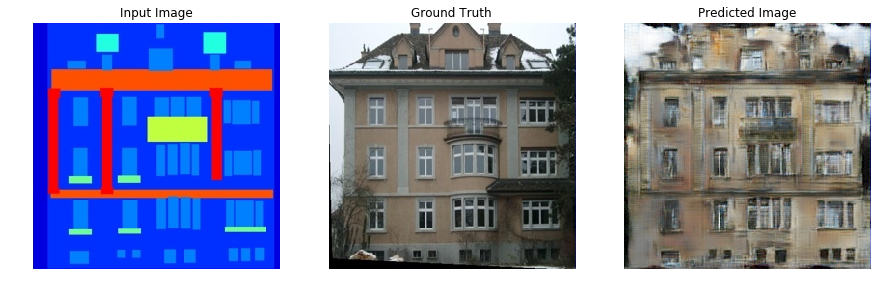

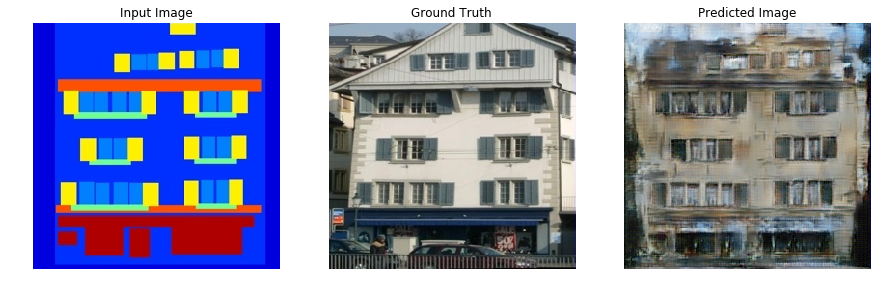

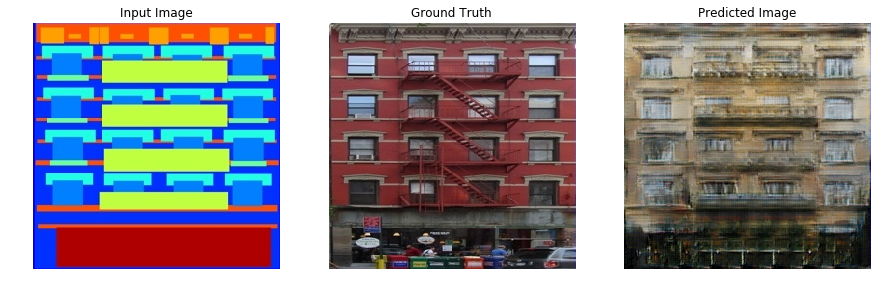

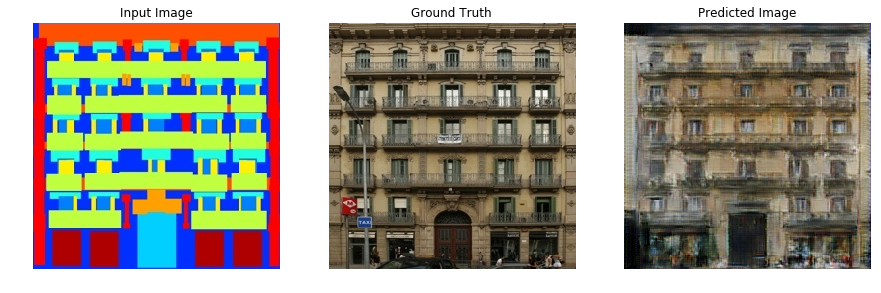

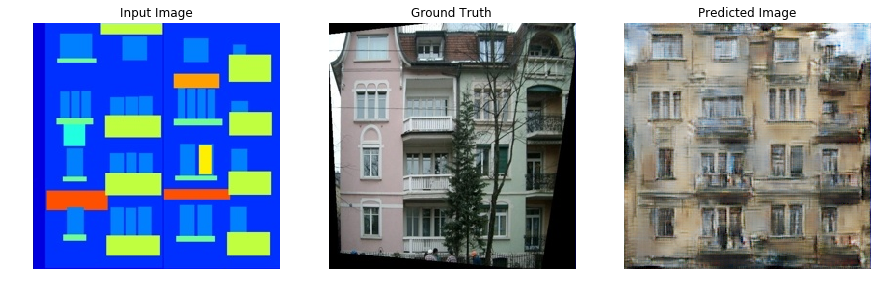

...

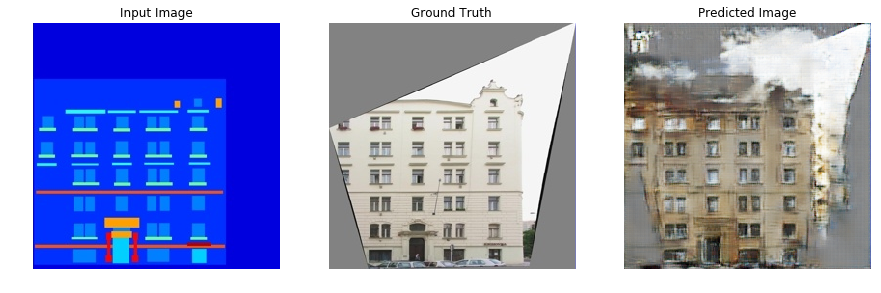

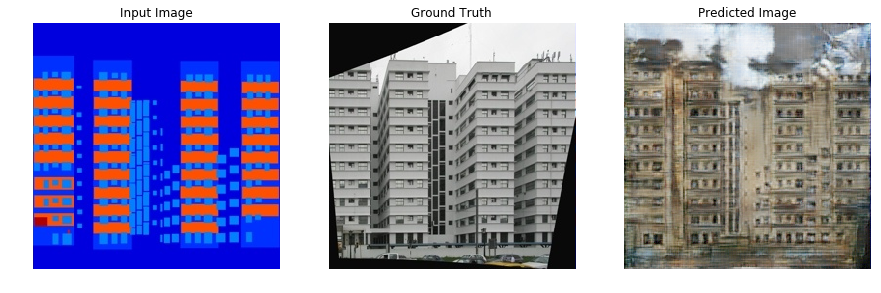

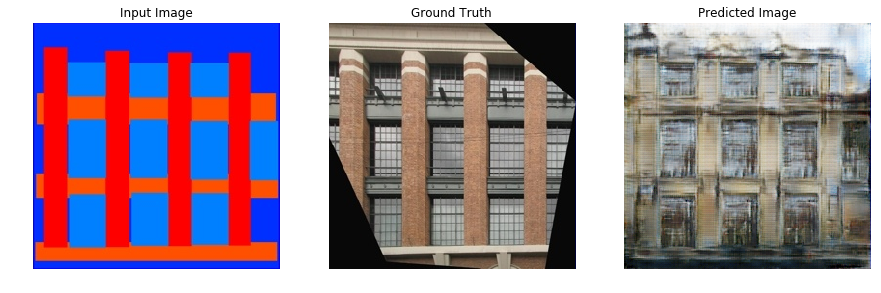

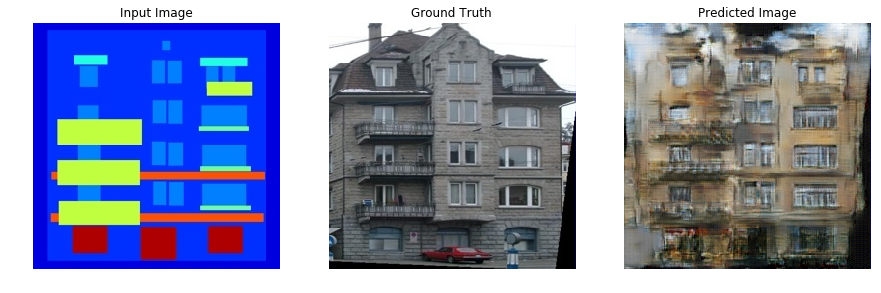

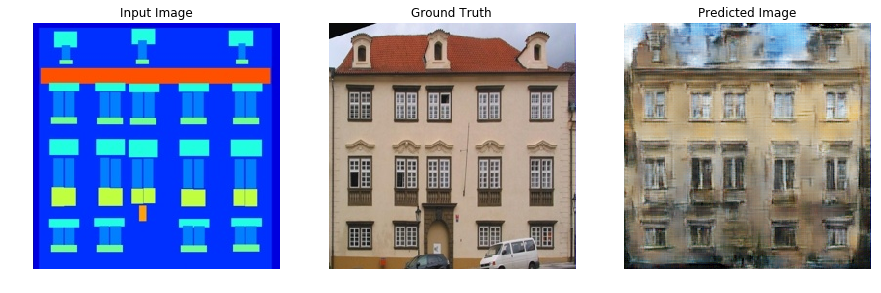

In [18]:
for i in range(40):
    x, y = val_gen.dataset[i]
    x = x.unsqueeze(0)
    y = y.unsqueeze(0)
    PlotPrediction(G, x.to(device), y.to(device), mode='test')